In [ ]:
import torch
torch.cuda.empty_cache()


In [ ]:
!pip install tqdm

In [ ]:
import kagglehub
path = kagglehub.dataset_download("noureldin199/lsui-large-scale-underwater-image-dataset")
print("Path to dataset files:", path)

100%|██████████| 471M/471M [00:22<00:00, 21.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/noureldin199/lsui-large-scale-underwater-image-dataset/versions/1


In [ ]:
import kagglehub
import shutil
dataset_path = kagglehub.dataset_download("noureldin199/lsui-large-scale-underwater-image-dataset")
target_path = "/content/LSUI"
shutil.move(dataset_path, target_path)
print("Dataset moved to:", target_path)

Dataset moved to: /content/LSUI


In [ ]:
!pip install pytorch-msssim --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 95.0 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import Dataset
from PIL import Image
import os
import torch.nn.functional as F
from tqdm import tqdm
from pytorch_msssim import ssim  # SSIM
from torch.optim.lr_scheduler import ReduceLROnPlateau


class LSUIDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.input_dir = os.path.join(root_dir, "input")
        self.gt_dir = os.path.join(root_dir, "GT")
        self.transform = transform

        self.input_images = sorted(os.listdir(self.input_dir))
        self.gt_images = sorted(os.listdir(self.gt_dir))

        assert len(self.input_images) == len(self.gt_images), "Mismatch in dataset size!"

    def __len__(self):
        return len(self.input_images)

    def __getitem__(self, idx):
        input_path = os.path.join(self.input_dir, self.input_images[idx])
        gt_path = os.path.join(self.gt_dir, self.gt_images[idx])

        input_image = Image.open(input_path).convert("RGB")
        gt_image = Image.open(gt_path).convert("RGB")

        if self.transform:
            input_image = self.transform(input_image)
            gt_image = self.transform(gt_image)

        return input_image, gt_image

transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

lsui_path = "/content/LSUI/LSUI"

lsui_dataset = LSUIDataset(root_dir=lsui_path, transform=transform)
train_size = int(0.8 * len(lsui_dataset))
val_size = len(lsui_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(lsui_dataset, [train_size, val_size])

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=False)

class WaveletBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ELU()
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        return self.dropout(self.relu(self.bn(self.conv(x))))

class WaveletUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder1 = WaveletBlock(3, 64)
        self.encoder2 = WaveletBlock(64, 128)
        self.encoder3 = WaveletBlock(128, 256)

        self.bottleneck = WaveletBlock(256, 512)

        self.decoder3 = WaveletBlock(512, 256)
        self.decoder2 = WaveletBlock(256, 128)
        self.decoder1 = WaveletBlock(128, 64)

        self.final_conv = nn.Conv2d(64, 3, kernel_size=3, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)

        b = self.bottleneck(e3)

        d3 = self.decoder3(b) + e3
        d2 = self.decoder2(d3) + e2
        d1 = self.decoder1(d2) + e1

        return self.tanh(self.final_conv(d1))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = WaveletUNet().to(device)

class SSIMLoss(nn.Module):
    def __init__(self):
        super(SSIMLoss, self).__init__()

    def forward(self, x, y):
        return 1 - ssim(x, y, data_range=2)

class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg16(pretrained=True).features[:16]
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg.eval().to(device)

    def forward(self, x, y):
        x = (x + 1) / 2
        y = (y + 1) / 2

        x_features = self.vgg(x)
        y_features = self.vgg(y)
        return F.mse_loss(x_features, y_features)

l1_loss = nn.L1Loss()
perceptual_loss = PerceptualLoss().to(device)
ssim_loss = SSIMLoss().to(device)

optimizer = optim.AdamW(model.parameters(), lr=0.0001, betas=(0.9, 0.999), weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20, eta_min=1e-6)

patience = 10
best_val_loss = float("inf")
counter = 0

max_epochs = 50
for epoch in range(max_epochs):
    model.train()
    total_loss = 0

    with tqdm(train_loader, unit="batch") as tepoch:
        for input_img, target_img in tepoch:
            tepoch.set_description(f"Epoch {epoch + 1}/{max_epochs}")

            input_img, target_img = input_img.to(device), target_img.to(device)

            optimizer.zero_grad()
            output_img = model(input_img)

            output_img_norm = (output_img + 1) / 2
            target_img_norm = (target_img + 1) / 2

            loss = (
                0.6 * l1_loss(output_img_norm, target_img_norm) +
                0.2 * perceptual_loss(output_img, target_img) +
                0.2 * ssim_loss(output_img_norm, target_img_norm)
            )

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            total_loss += loss.item()
            tepoch.set_postfix(loss=loss.item())

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for input_img, target_img in val_loader:
            input_img, target_img = input_img.to(device), target_img.to(device)
            output_img = model(input_img)

            output_img_norm = (output_img + 1) / 2
            target_img_norm = (target_img + 1) / 2

            loss = (
                0.6 * l1_loss(output_img_norm, target_img_norm) +
                0.2 * perceptual_loss(output_img, target_img) +
                0.2 * ssim_loss(output_img_norm, target_img_norm)
            )
            val_loss += loss.item()

    val_loss /= len(val_loader)
    print(f"Epoch {epoch+1}/{max_epochs}, Training Loss: {total_loss/len(train_loader):.4f}, Validation Loss: {val_loss:.4f}")

    scheduler.step(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        torch.save(model.state_dict(), "best_model.pth")
        print("✅ Model saved (new best validation loss)")
    else:
        counter += 1
        print(f"⏳ No improvement for {counter}/{patience} epochs")

        if counter >= patience:
            print(f"⛔ Early stopping at epoch {epoch+1}")
            break
    print(f"Epoch {epoch+1}/{max_epochs}, Loss: {total_loss / len(train_loader):.4f}")


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/50: 100%|██████████| 214/214 [02:51<00:00,  1.25batch/s, loss=0.351]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed

Epoch 1/50, Training Loss: 0.5172, Validation Loss: 0.2097
✅ Model saved (new best validation loss)
Epoch 1/50, Loss: 0.5172


Epoch 2/50: 100%|██████████| 214/214 [02:47<00:00,  1.27batch/s, loss=0.25]


Epoch 2/50, Training Loss: 0.3082, Validation Loss: 0.1519
✅ Model saved (new best validation loss)
Epoch 2/50, Loss: 0.3082


Epoch 3/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.196]


Epoch 3/50, Training Loss: 0.2330, Validation Loss: 0.1459
✅ Model saved (new best validation loss)
Epoch 3/50, Loss: 0.2330


Epoch 4/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.201]


Epoch 4/50, Training Loss: 0.1990, Validation Loss: 0.1397
✅ Model saved (new best validation loss)
Epoch 4/50, Loss: 0.1990


Epoch 5/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.167]


Epoch 5/50, Training Loss: 0.1818, Validation Loss: 0.1344
✅ Model saved (new best validation loss)
Epoch 5/50, Loss: 0.1818


Epoch 6/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.145]


Epoch 6/50, Training Loss: 0.1719, Validation Loss: 0.1301
✅ Model saved (new best validation loss)
Epoch 6/50, Loss: 0.1719


Epoch 7/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.191]


Epoch 7/50, Training Loss: 0.1643, Validation Loss: 0.1309
⏳ No improvement for 1/10 epochs
Epoch 7/50, Loss: 0.1643


Epoch 8/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.163]


Epoch 8/50, Training Loss: 0.1586, Validation Loss: 0.1299
✅ Model saved (new best validation loss)
Epoch 8/50, Loss: 0.1586


Epoch 9/50: 100%|██████████| 214/214 [02:47<00:00,  1.28batch/s, loss=0.141]


Epoch 9/50, Training Loss: 0.1552, Validation Loss: 0.1284
✅ Model saved (new best validation loss)
Epoch 9/50, Loss: 0.1552


Epoch 10/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.149]


Epoch 10/50, Training Loss: 0.1512, Validation Loss: 0.1264
✅ Model saved (new best validation loss)
Epoch 10/50, Loss: 0.1512


Epoch 11/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.156]


Epoch 11/50, Training Loss: 0.1484, Validation Loss: 0.1229
✅ Model saved (new best validation loss)
Epoch 11/50, Loss: 0.1484


Epoch 12/50: 100%|██████████| 214/214 [02:47<00:00,  1.28batch/s, loss=0.133]


Epoch 12/50, Training Loss: 0.1467, Validation Loss: 0.1220
✅ Model saved (new best validation loss)
Epoch 12/50, Loss: 0.1467


Epoch 13/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.145]


Epoch 13/50, Training Loss: 0.1455, Validation Loss: 0.1226
⏳ No improvement for 1/10 epochs
Epoch 13/50, Loss: 0.1455


Epoch 14/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.14]


Epoch 14/50, Training Loss: 0.1441, Validation Loss: 0.1238
⏳ No improvement for 2/10 epochs
Epoch 14/50, Loss: 0.1441


Epoch 15/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.139]


Epoch 15/50, Training Loss: 0.1423, Validation Loss: 0.1211
✅ Model saved (new best validation loss)
Epoch 15/50, Loss: 0.1423


Epoch 16/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.148]


Epoch 16/50, Training Loss: 0.1411, Validation Loss: 0.1205
✅ Model saved (new best validation loss)
Epoch 16/50, Loss: 0.1411


Epoch 17/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.132]


Epoch 17/50, Training Loss: 0.1408, Validation Loss: 0.1215
⏳ No improvement for 1/10 epochs
Epoch 17/50, Loss: 0.1408


Epoch 18/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.132]


Epoch 18/50, Training Loss: 0.1399, Validation Loss: 0.1193
✅ Model saved (new best validation loss)
Epoch 18/50, Loss: 0.1399


Epoch 19/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.156]


Epoch 19/50, Training Loss: 0.1381, Validation Loss: 0.1165
✅ Model saved (new best validation loss)
Epoch 19/50, Loss: 0.1381


Epoch 20/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.15]


Epoch 20/50, Training Loss: 0.1375, Validation Loss: 0.1174
⏳ No improvement for 1/10 epochs
Epoch 20/50, Loss: 0.1375


Epoch 21/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.143]


Epoch 21/50, Training Loss: 0.1364, Validation Loss: 0.1183
⏳ No improvement for 2/10 epochs
Epoch 21/50, Loss: 0.1364


Epoch 22/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.124]


Epoch 22/50, Training Loss: 0.1363, Validation Loss: 0.1181
⏳ No improvement for 3/10 epochs
Epoch 22/50, Loss: 0.1363


Epoch 23/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.118]


Epoch 23/50, Training Loss: 0.1353, Validation Loss: 0.1142
✅ Model saved (new best validation loss)
Epoch 23/50, Loss: 0.1353


Epoch 24/50: 100%|██████████| 214/214 [02:47<00:00,  1.28batch/s, loss=0.128]


Epoch 24/50, Training Loss: 0.1345, Validation Loss: 0.1148
⏳ No improvement for 1/10 epochs
Epoch 24/50, Loss: 0.1345


Epoch 25/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.146]


Epoch 25/50, Training Loss: 0.1339, Validation Loss: 0.1141
✅ Model saved (new best validation loss)
Epoch 25/50, Loss: 0.1339


Epoch 26/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.129]


Epoch 26/50, Training Loss: 0.1340, Validation Loss: 0.1126
✅ Model saved (new best validation loss)
Epoch 26/50, Loss: 0.1340


Epoch 27/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.139]


Epoch 27/50, Training Loss: 0.1332, Validation Loss: 0.1148
⏳ No improvement for 1/10 epochs
Epoch 27/50, Loss: 0.1332


Epoch 28/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.12]


Epoch 28/50, Training Loss: 0.1323, Validation Loss: 0.1140
⏳ No improvement for 2/10 epochs
Epoch 28/50, Loss: 0.1323


Epoch 29/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.125]


Epoch 29/50, Training Loss: 0.1328, Validation Loss: 0.1127
⏳ No improvement for 3/10 epochs
Epoch 29/50, Loss: 0.1328


Epoch 30/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.119]


Epoch 30/50, Training Loss: 0.1314, Validation Loss: 0.1126
⏳ No improvement for 4/10 epochs
Epoch 30/50, Loss: 0.1314


Epoch 31/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.146]


Epoch 31/50, Training Loss: 0.1311, Validation Loss: 0.1111
✅ Model saved (new best validation loss)
Epoch 31/50, Loss: 0.1311


Epoch 32/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.153]


Epoch 32/50, Training Loss: 0.1303, Validation Loss: 0.1145
⏳ No improvement for 1/10 epochs
Epoch 32/50, Loss: 0.1303


Epoch 33/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.116]


Epoch 33/50, Training Loss: 0.1307, Validation Loss: 0.1127
⏳ No improvement for 2/10 epochs
Epoch 33/50, Loss: 0.1307


Epoch 34/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.125]


Epoch 34/50, Training Loss: 0.1303, Validation Loss: 0.1131
⏳ No improvement for 3/10 epochs
Epoch 34/50, Loss: 0.1303


Epoch 35/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.157]


Epoch 35/50, Training Loss: 0.1298, Validation Loss: 0.1114
⏳ No improvement for 4/10 epochs
Epoch 35/50, Loss: 0.1298


Epoch 36/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.125]


Epoch 36/50, Training Loss: 0.1282, Validation Loss: 0.1112
⏳ No improvement for 5/10 epochs
Epoch 36/50, Loss: 0.1282


Epoch 37/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.129]


Epoch 37/50, Training Loss: 0.1283, Validation Loss: 0.1104
✅ Model saved (new best validation loss)
Epoch 37/50, Loss: 0.1283


Epoch 38/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.13]


Epoch 38/50, Training Loss: 0.1283, Validation Loss: 0.1101
✅ Model saved (new best validation loss)
Epoch 38/50, Loss: 0.1283


Epoch 39/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.129]


Epoch 39/50, Training Loss: 0.1281, Validation Loss: 0.1099
✅ Model saved (new best validation loss)
Epoch 39/50, Loss: 0.1281


Epoch 40/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.116]


Epoch 40/50, Training Loss: 0.1271, Validation Loss: 0.1097
✅ Model saved (new best validation loss)
Epoch 40/50, Loss: 0.1271


Epoch 41/50: 100%|██████████| 214/214 [02:46<00:00,  1.29batch/s, loss=0.115]


Epoch 41/50, Training Loss: 0.1279, Validation Loss: 0.1101
⏳ No improvement for 1/10 epochs
Epoch 41/50, Loss: 0.1279


Epoch 42/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.114]


Epoch 42/50, Training Loss: 0.1271, Validation Loss: 0.1084
✅ Model saved (new best validation loss)
Epoch 42/50, Loss: 0.1271


Epoch 43/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.126]


Epoch 43/50, Training Loss: 0.1276, Validation Loss: 0.1104
⏳ No improvement for 1/10 epochs
Epoch 43/50, Loss: 0.1276


Epoch 44/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.112]


Epoch 44/50, Training Loss: 0.1268, Validation Loss: 0.1070
✅ Model saved (new best validation loss)
Epoch 44/50, Loss: 0.1268


Epoch 45/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.116]


Epoch 45/50, Training Loss: 0.1266, Validation Loss: 0.1072
⏳ No improvement for 1/10 epochs
Epoch 45/50, Loss: 0.1266


Epoch 46/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.128]


Epoch 46/50, Training Loss: 0.1261, Validation Loss: 0.1063
✅ Model saved (new best validation loss)
Epoch 46/50, Loss: 0.1261


Epoch 47/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.128]


Epoch 47/50, Training Loss: 0.1260, Validation Loss: 0.1061
✅ Model saved (new best validation loss)
Epoch 47/50, Loss: 0.1260


Epoch 48/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.147]


Epoch 48/50, Training Loss: 0.1260, Validation Loss: 0.1064
⏳ No improvement for 1/10 epochs
Epoch 48/50, Loss: 0.1260


Epoch 49/50: 100%|██████████| 214/214 [02:47<00:00,  1.28batch/s, loss=0.144]


Epoch 49/50, Training Loss: 0.1249, Validation Loss: 0.1074
⏳ No improvement for 2/10 epochs
Epoch 49/50, Loss: 0.1249


Epoch 50/50: 100%|██████████| 214/214 [02:46<00:00,  1.28batch/s, loss=0.103]


Epoch 50/50, Training Loss: 0.1246, Validation Loss: 0.1069
⏳ No improvement for 3/10 epochs
Epoch 50/50, Loss: 0.1246


In [ ]:
save_path = "/content/LSUI/LSUI/EWUnet_model.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved at {save_path}")

Model saved at /content/LSUI/LSUI/EWUnet_model.pth


In [ ]:
torch.save(model.state_dict(), "EWUnet_model_wieghts.pth")  # Saving model weights

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from tqdm import tqdm

def evaluate_model(model, dataloader, device):
    model.eval()
    total_psnr = 0.0
    total_ssim = 0.0
    num_samples = 0

    with torch.no_grad():
        for input_img, target_img in tqdm(dataloader, desc="Evaluating", unit="batch"):
            input_img, target_img = input_img.to(device), target_img.to(device)
            output_img = model(input_img)

            output_np = ((output_img.cpu().numpy().transpose(0, 2, 3, 1)) + 1) / 2
            target_np = ((target_img.cpu().numpy().transpose(0, 2, 3, 1)) + 1) / 2

            for i in range(output_np.shape[0]):
                total_psnr += psnr(target_np[i].astype(np.float32), output_np[i].astype(np.float32), data_range=1.0)
                total_ssim += ssim(target_np[i].astype(np.float32), output_np[i].astype(np.float32),
                                   data_range=1.0, win_size=7, channel_axis=-1)

            num_samples += output_np.shape[0]

    avg_psnr = total_psnr / num_samples
    avg_ssim = total_ssim / num_samples

    print(f"Average PSNR: {avg_psnr:.4f} dB")
    print(f" Average SSIM: {avg_ssim:.4f}")

    return avg_psnr, avg_ssim

evaluate_model(model, val_loader, device)

Evaluating: 100%|██████████| 54/54 [00:19<00:00,  2.77batch/s]

Average PSNR: 23.4708 dB
 Average SSIM: 0.9127


(np.float64(23.470762221238694), np.float32(0.91268206))

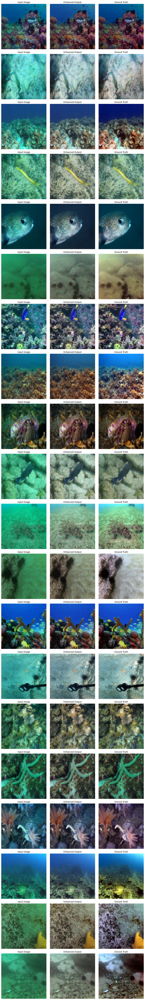

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def test_and_visualize(model, dataloader, device, num_samples=10):
    model.eval()
    num_samples = min(num_samples, len(dataloader))
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))

    with torch.no_grad():
        for i, (input_images, target_images) in enumerate(dataloader):
            if i >= num_samples:
                break

            input_images, target_images = input_images.to(device), target_images.to(device)

            output_images = model(input_images)

            def tensor_to_image(tensor):
                tensor = tensor.cpu().numpy().transpose(0, 2, 3, 1)
                tensor = (tensor + 1) / 2
                return np.clip(tensor, 0, 1)

            input_np = tensor_to_image(input_images)
            output_np = tensor_to_image(output_images)
            target_np = tensor_to_image(target_images)

            # Plot images
            axes[i, 0].imshow(input_np[0])
            axes[i, 0].set_title("Input Image")
            axes[i, 0].axis("off")

            axes[i, 1].imshow(output_np[0])
            axes[i, 1].set_title("Enhanced Output")
            axes[i, 1].axis("off")

            axes[i, 2].imshow(target_np[0])
            axes[i, 2].set_title("Ground Truth")
            axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

test_and_visualize(model, val_loader, device, num_samples=20)  # Adjust num_samples as needed




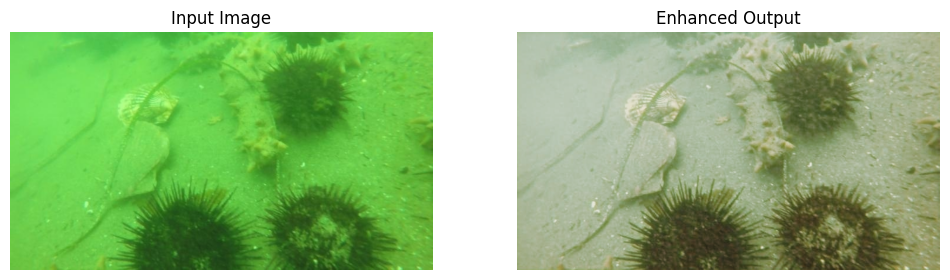

In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

class WaveletBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn = torch.nn.BatchNorm2d(out_channels)
        self.relu = torch.nn.ELU()
        self.dropout = torch.nn.Dropout(0.3)

    def forward(self, x):
        return self.dropout(self.relu(self.bn(self.conv(x))))

class WaveletUNet(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder1 = WaveletBlock(3, 64)
        self.encoder2 = WaveletBlock(64, 128)
        self.encoder3 = WaveletBlock(128, 256)

        self.bottleneck = WaveletBlock(256, 512)

        self.decoder3 = WaveletBlock(512, 256)
        self.decoder2 = WaveletBlock(256, 128)
        self.decoder1 = WaveletBlock(128, 64)

        self.final_conv = torch.nn.Conv2d(64, 3, kernel_size=3, padding=1)
        self.tanh = torch.nn.Tanh()

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)

        b = self.bottleneck(e3)

        d3 = self.decoder3(b) + e3
        d2 = self.decoder2(d3) + e2
        d1 = self.decoder1(d2) + e1

        return self.tanh(self.final_conv(d1))  # Output in [-1,1]

model_path = "/content/EWUnet_model.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = WaveletUNet().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

input_image_path = "/content/LSUI/LSUI/input/1437.jpg"
input_image = Image.open(input_image_path).convert("RGB")

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

input_tensor = transform(input_image).unsqueeze(0).to(device)

with torch.no_grad():
    output_tensor = model(input_tensor)

output_tensor = (output_tensor.squeeze(0).cpu() + 1) / 2
output_image = transforms.ToPILImage()(output_tensor)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(input_image)
axes[0].set_title("Input Image")
axes[0].axis("off")

axes[1].imshow(output_image)
axes[1].set_title("Enhanced Output")
axes[1].axis("off")

plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


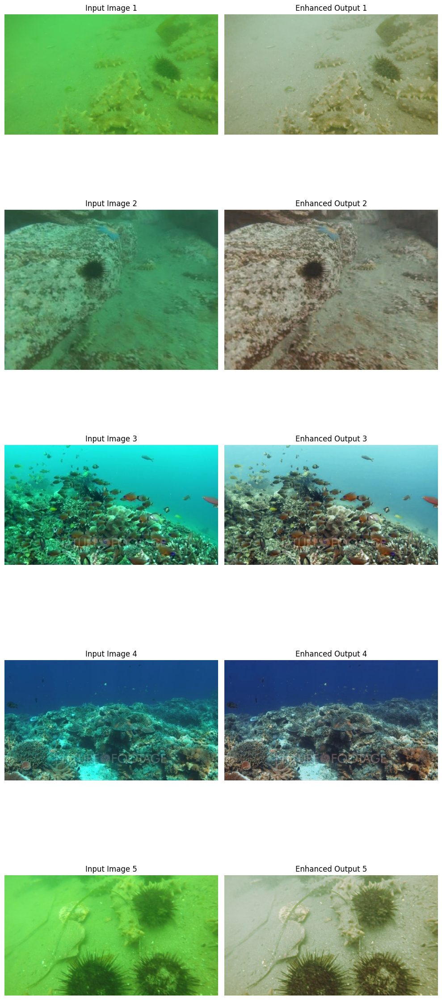

In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import os

class WaveletBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn = torch.nn.BatchNorm2d(out_channels)
        self.relu = torch.nn.ELU()
        self.dropout = torch.nn.Dropout(0.3)

    def forward(self, x):
        return self.dropout(self.relu(self.bn(self.conv(x))))

class WaveletUNet(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder1 = WaveletBlock(3, 64)
        self.encoder2 = WaveletBlock(64, 128)
        self.encoder3 = WaveletBlock(128, 256)

        self.bottleneck = WaveletBlock(256, 512)

        self.decoder3 = WaveletBlock(512, 256)
        self.decoder2 = WaveletBlock(256, 128)
        self.decoder1 = WaveletBlock(128, 64)

        self.final_conv = torch.nn.Conv2d(64, 3, kernel_size=3, padding=1)
        self.tanh = torch.nn.Tanh()

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)

        b = self.bottleneck(e3)

        d3 = self.decoder3(b) + e3
        d2 = self.decoder2(d3) + e2
        d1 = self.decoder1(d2) + e1

        return self.tanh(self.final_conv(d1))

model_path = "/content/EWUnet_model.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = WaveletUNet().to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Scale to [-1,1]
])

input_folder = "/content/drive/MyDrive/Input images"
output_images = []

image_files = sorted([f for f in os.listdir(input_folder) if f.endswith((".jpg", ".png"))])

for image_file in image_files:
    input_image_path = os.path.join(input_folder, image_file)

    input_image = Image.open(input_image_path).convert("RGB")
    input_tensor = transform(input_image).unsqueeze(0).to(device)

    with torch.no_grad():
        output_tensor = model(input_tensor)

    output_tensor = (output_tensor.squeeze(0).cpu() + 1) / 2
    output_image = transforms.ToPILImage()(output_tensor)

    output_images.append((input_image, output_image))

num_images = len(output_images)
fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))

for i, (input_img, output_img) in enumerate(output_images):
    axes[i, 0].imshow(input_img)
    axes[i, 0].set_title(f"Input Image {i+1}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(output_img)
    axes[i, 1].set_title(f"Enhanced Output {i+1}")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()
